In [1]:
from keras import backend as k

In [2]:
k.clear_session()

In [3]:
import tensorflow as tf
import os, shutil
import numpy as np
import tensorflow_datasets as tfds
import pandas as pd
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras import models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, Input, BatchNormalization, Lambda
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras import utils

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
original_dataset_dir = '/content/drive/MyDrive/chest_x_ray'
train_dir = "/content/drive/MyDrive/chest_x_ray/train_images"
train_labels= pd.read_csv("/content/drive/MyDrive/chest_x_ray/labels_train.csv")
validation_images = '/content/drive/MyDrive/chest_x_ray/validation_images'
test_dir = '/content/drive/MyDrive/chest_x_ray/test_1'
test_dir_1 = '/content/drive/MyDrive/chest_x_ray/test'

In [6]:
class0 = '/content/drive/MyDrive/chest_x_ray/validation_image/class0'
class1 = '/content/drive/MyDrive/chest_x_ray/validation_image/class1'
class2 = '/content/drive/MyDrive/chest_x_ray/validation_image/class2'

In [ ]:
train_images = "/content/drive/MyDrive/chest_x_ray/train_images/train_images"

In [ ]:
print('total train_class0 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/train_images/class0")))
print('total train_class1 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/train_images/class1")))
print('total train_class2 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/train_images/class2")))
print('total validation_class0 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/validation_images/class0")))
print('total validation_class1 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/validation_images/class1")))
print('total validation_class2 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/validation_images/class2")))
print('total test_class0 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/test_1/class0")))
print('total test_class1 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/test_1/class1")))
print('total test_class2 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/test_1/class2")))

total train_class0 images: 958
total train_class1 images: 1810
total train_class2 images: 962
total validation_class0 images: 259
total validation_class1 images: 418
total validation_class2 images: 235
total test_class0 images: 10
total test_class1 images: 10
total test_class2 images: 10


_________________________________________________________________________________________________________________________
_________________________________________________________________________________________________________________________
_________________________________________________________________________________________________________________________

**ResNet50V2**

In [7]:
from tensorflow.keras.applications import ResNet50V2
conv_base = ResNet50V2(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

94668760/94668760 [==============================] - 0s 0us/step


In [8]:
conv_base.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

In [9]:
x = conv_base.output #(in your case pre_trained model is efficientnet-b3)

flatten = layers.Flatten()(x)

dense1 = layers.Dense(256, activation='relu')(flatten)

pred = layers.Dense(3, activation='softmax')(dense1)


model = Model(inputs= conv_base.input, outputs=pred) 

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [10]:
print('This is the number of trainable weights '
'before freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights before freezing the conv base: 176


In [11]:
conv_base.trainable = False
print('This is the number of trainable weights '
'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


In [12]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
    validation_images,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

Found 3730 images belonging to 3 classes.
Found 912 images belonging to 3 classes.


In [ ]:
model.summary()

In [14]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [15]:
history = model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator)

Epoch 1/40
117/117 [==============================] - 1174s 10s/step - loss: 2.8816 - accuracy: 0.6308 - val_loss: 0.5999 - val_accuracy: 0.7566
Epoch 2/40
117/117 [==============================] - 142s 1s/step - loss: 0.7303 - accuracy: 0.7115 - val_loss: 0.5582 - val_accuracy: 0.7873
Epoch 3/40
117/117 [==============================] - 141s 1s/step - loss: 0.6804 - accuracy: 0.7295 - val_loss: 0.5782 - val_accuracy: 0.7664
Epoch 4/40
117/117 [==============================] - 143s 1s/step - loss: 0.6256 - accuracy: 0.7416 - val_loss: 0.6439 - val_accuracy: 0.7423
Epoch 5/40
117/117 [==============================] - 160s 1s/step - loss: 0.5959 - accuracy: 0.7625 - val_loss: 0.5380 - val_accuracy: 0.7939
Epoch 6/40
117/117 [==============================] - 140s 1s/step - loss: 0.6058 - accuracy: 0.7673 - val_loss: 0.6411 - val_accuracy: 0.7599
Epoch 7/40
117/117 [==============================] - 140s 1s/step - loss: 0.5710 - accuracy: 0.7740 - val_loss: 0.7537 - val_accuracy: 0.72

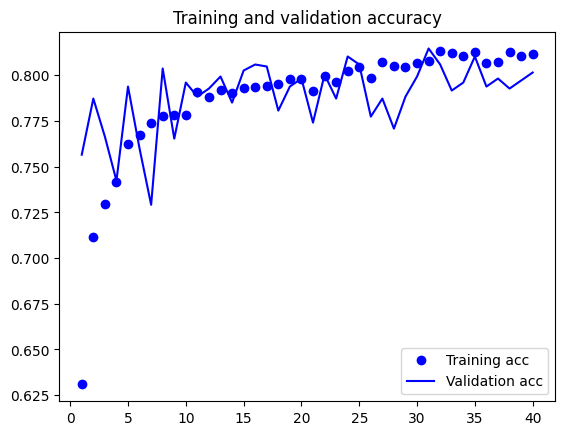

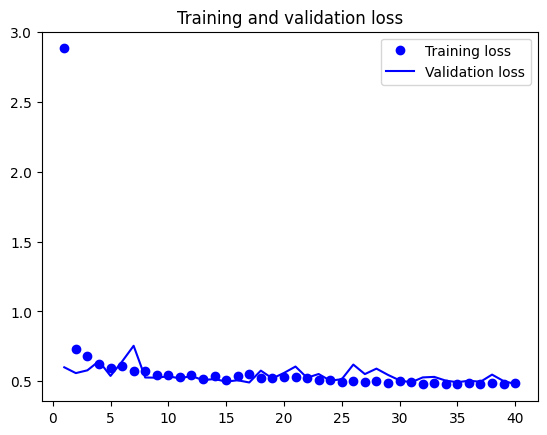

In [16]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

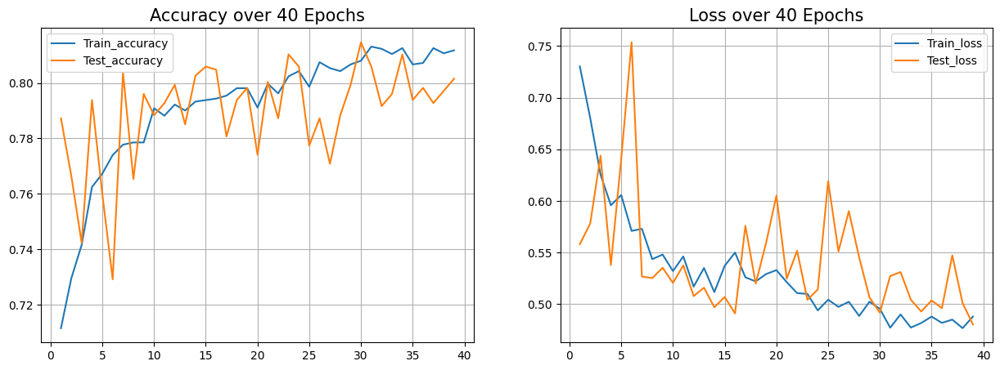

In [17]:
epoch=30
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 40)

In [18]:
model.save("/content/drive/MyDrive/chest_x_ray/modelos/modelresnet50v2_1.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/modelos/pesosresnet50v2_1.h")

In [19]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    validation_images,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')
test_loss, test_acc = model.evaluate(test_generator)
print("test loss", test_loss)
print('test acc:', test_acc)

Found 912 images belonging to 3 classes.
29/29 [==============================] - 22s 744ms/step - loss: 0.4803 - accuracy: 0.8015
test loss 0.48032695055007935
test acc: 0.8015350699424744


In [20]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')
test_loss, test_acc = model.evaluate(test_generator)
print("test loss", test_loss)
print('test acc:', test_acc)

Found 30 images belonging to 3 classes.
1/1 [==============================] - 2s 2s/step - loss: 0.5018 - accuracy: 0.7667
test loss 0.5017911195755005
test acc: 0.7666666507720947


**Prediccion**

In [ ]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelos/modelresnet50v2_1.h")

In [21]:
class0 = '/content/drive/MyDrive/chest_x_ray/validation_images/class0'
class1 = '/content/drive/MyDrive/chest_x_ray/validation_images/class1'
class2 = '/content/drive/MyDrive/chest_x_ray/validation_images/class2'

In [22]:
import cv2
from imutils import paths
imagePaths = list(paths.list_images(class0))
data = []
labels = []
for imagePath in imagePaths:
    label = 0
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    # update the data and labels lists, respectively
    data.append(image)
    labels.append(label)
data = np.array(data) /255
labels = np.array(labels)

imagePaths1 = list(paths.list_images(class1))
data1 = []
labels1 = []
for imagePath in imagePaths1:
    label1 = 1
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data1.append(image)
    labels1.append(label1)

data1 = np.array(data1) / 255
labels1 = np.array(labels1)

imagePaths2 = list(paths.list_images(class2))
data2 = []
labels2 = []
for imagePath in imagePaths2:
    label2 = 2
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data2.append(image)
    labels2.append(label2)
data2 = np.array(data2) / 255
labels2 = np.array(labels2)

dataset = np.concatenate((data, data1, data2), axis=0)
label = np.concatenate((labels, labels1, labels2), axis=0)

label2 = to_categorical(label)

label1 = to_categorical(label)

In [23]:
from sklearn.metrics import classification_report
BS = 8
print("[INFO] evaluating network...")
predIdxs = model.predict(dataset, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(label1.argmax(axis=1), predIdxs,digits=4))

[INFO] evaluating network...
114/114 [==============================] - 5s 27ms/step
              precision    recall  f1-score   support

           0     0.8791    0.9266    0.9023       259
           1     0.7863    0.8541    0.8188       418
           2     0.7027    0.5532    0.6190       235

    accuracy                         0.7971       912
   macro avg     0.7894    0.7780    0.7800       912
weighted avg     0.7911    0.7971    0.7910       912



acc: 0.6546
sensitivity: 0.9717
specificity: 0.9520


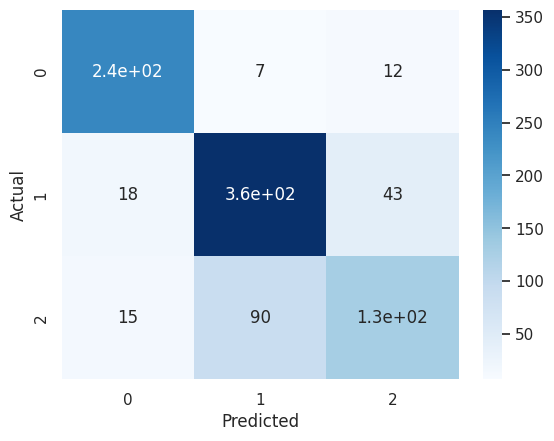

<Figure size 1600x1200 with 0 Axes>

In [24]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(label1.argmax(axis=1), predIdxs)
sns.set(font_scale=1)#for label size
sns.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 12})# font siz
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.figure(figsize = (16,12))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

29/29 [==============================] - 3s 85ms/step
Total-test-data; 912 	accurately-predicted-data: 727 	 wrongly-predicted-data:  185
Accuracy: 79.715 %


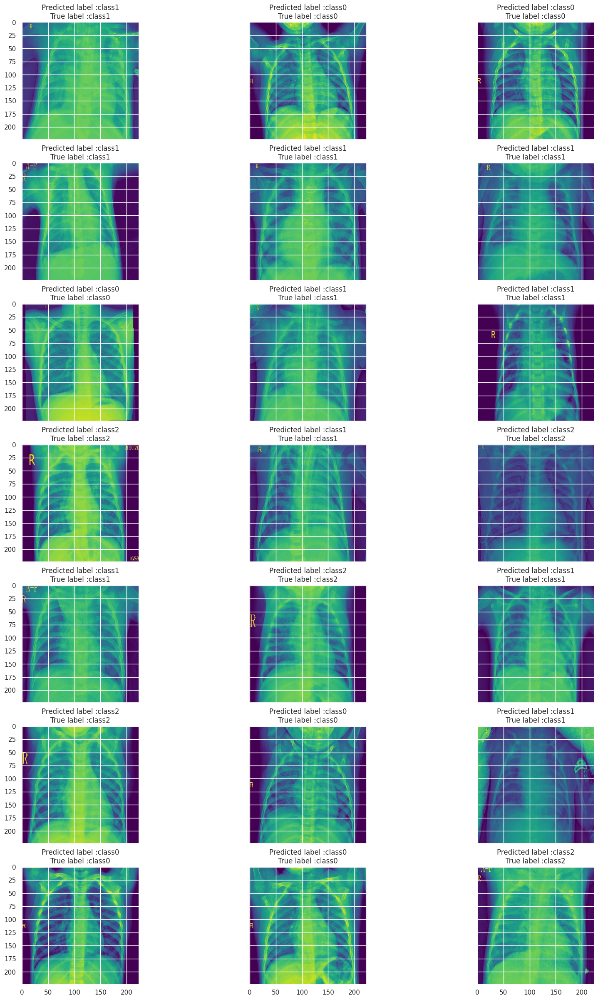

In [25]:
import random
ypred = model.predict(dataset)
total = 0
accurate = 0
accurateindex = []
wrongindex = []

for i in range(len(ypred)):
    if np.argmax(ypred[i]) == np.argmax(label1[i]):
        accurate += 1
        accurateindex.append(i)
    else:
        wrongindex.append(i)
        
    total += 1
    
print('Total-test-data;', total, '\taccurately-predicted-data:', accurate, '\t wrongly-predicted-data: ', total - accurate)
print('Accuracy:', round(accurate/total*100, 3), '%')
label= {0: 'class0', 1: 'class1', 2: 'class2'}
imidx = random.sample(accurateindex, k=21)# replace with 'wrongindex'

nrows = 7
ncols = 3
fig, ax = plt.subplots(nrows,ncols,sharex=True,sharey=True,figsize=(20, 30))

n = 0
for row in range(nrows):
    for col in range(ncols):
            ax[row,col].imshow(dataset[imidx[n]])
            ax[row,col].set_title("Predicted label :{}\nTrue label :{}".format(label[np.argmax(ypred[imidx[n]])], label[np.argmax(label1[imidx[n]])]))
            n += 1


_______________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________
_______________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________

In [26]:
class0 = '/content/drive/MyDrive/chest_x_ray/test_1/class0'
class1 = '/content/drive/MyDrive/chest_x_ray/test_1/class1'
class2 = '/content/drive/MyDrive/chest_x_ray/test_1/class2'

In [27]:
import cv2
from imutils import paths
imagePaths = list(paths.list_images(class0))
data = []
labels = []
for imagePath in imagePaths:
    label = 0
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    # update the data and labels lists, respectively
    data.append(image)
    labels.append(label)
data = np.array(data) /255
labels = np.array(labels)

imagePaths1 = list(paths.list_images(class1))
data1 = []
labels1 = []
for imagePath in imagePaths1:
    label1 = 1
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data1.append(image)
    labels1.append(label1)

data1 = np.array(data1) / 255
labels1 = np.array(labels1)

imagePaths2 = list(paths.list_images(class2))
data2 = []
labels2 = []
for imagePath in imagePaths2:
    label2 = 2
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data2.append(image)
    labels2.append(label2)
data2 = np.array(data2) / 255
labels2 = np.array(labels2)

dataset = np.concatenate((data, data1, data2), axis=0)
label = np.concatenate((labels, labels1, labels2), axis=0)

label2 = to_categorical(label)

label1 = to_categorical(label)

In [28]:
from sklearn.metrics import classification_report
BS = 8
print("[INFO] evaluating network...")
predIdxs = model.predict(dataset, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(label1.argmax(axis=1), predIdxs,digits=4))

[INFO] evaluating network...
4/4 [==============================] - 1s 258ms/step
              precision    recall  f1-score   support

           0     0.9000    0.9000    0.9000        10
           1     0.6250    1.0000    0.7692        10
           2     1.0000    0.4000    0.5714        10

    accuracy                         0.7667        30
   macro avg     0.8417    0.7667    0.7469        30
weighted avg     0.8417    0.7667    0.7469        30



acc: 0.6333
sensitivity: 0.9000
specificity: 1.0000


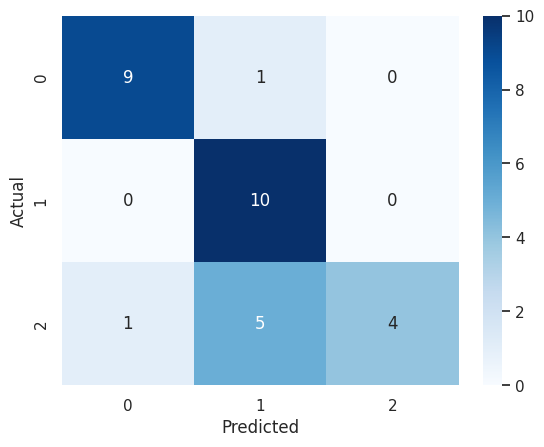

<Figure size 1600x1200 with 0 Axes>

In [29]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(label1.argmax(axis=1), predIdxs)
sns.set(font_scale=1)#for label size
sns.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 12})# font siz
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.figure(figsize = (16,12))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

1/1 [==============================] - 0s 52ms/step
Total-test-data; 30 	accurately-predicted-data: 23 	 wrongly-predicted-data:  7
Accuracy: 76.667 %


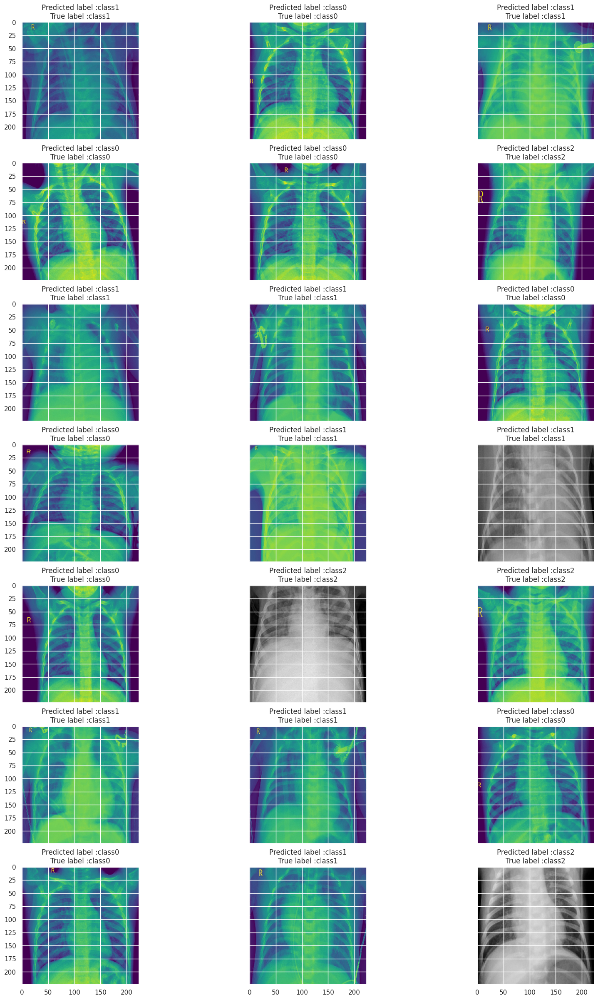

In [30]:
import random
ypred = model.predict(dataset)
total = 0
accurate = 0
accurateindex = []
wrongindex = []

for i in range(len(ypred)):
    if np.argmax(ypred[i]) == np.argmax(label1[i]):
        accurate += 1
        accurateindex.append(i)
    else:
        wrongindex.append(i)
        
    total += 1
    
print('Total-test-data;', total, '\taccurately-predicted-data:', accurate, '\t wrongly-predicted-data: ', total - accurate)
print('Accuracy:', round(accurate/total*100, 3), '%')
label= {0: 'class0', 1: 'class1', 2: 'class2'}
imidx = random.sample(accurateindex, k=21)# replace with 'wrongindex'

nrows = 7
ncols = 3
fig, ax = plt.subplots(nrows,ncols,sharex=True,sharey=True,figsize=(20, 30))

n = 0
for row in range(nrows):
    for col in range(ncols):
            ax[row,col].imshow(dataset[imidx[n]])
            ax[row,col].set_title("Predicted label :{}\nTrue label :{}".format(label[np.argmax(ypred[imidx[n]])], label[np.argmax(label1[imidx[n]])]))
            n += 1

plt.show()

**Visualización de las convnets**

In [31]:
img_class0 ='/content/drive/MyDrive/chest_x_ray/test_1/class0/img_1575849049541638179.jpg'
img_class1 ='/content/drive/MyDrive/chest_x_ray/test_1/class1/img_9198611719791156730.jpg'
img_class2 ='/content/drive/MyDrive/chest_x_ray/test_1/class2/img_3753314631059921298.jpg'

In [32]:
from tensorflow.keras import utils
img_path = img_class2
from keras.preprocessing import image
import numpy as np
img = utils.load_img(img_path, target_size=(224, 224))
img_tensor = utils.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

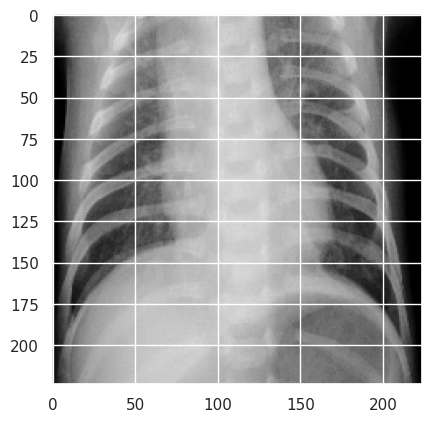

In [33]:
import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()

In [34]:
from tensorflow.keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [35]:
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 0s 182ms/step


In [36]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 224, 224, 3)


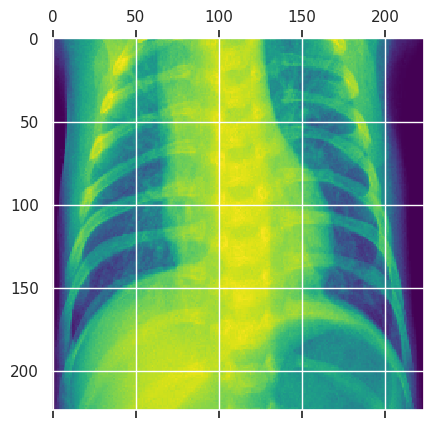

In [37]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 1], cmap='viridis')

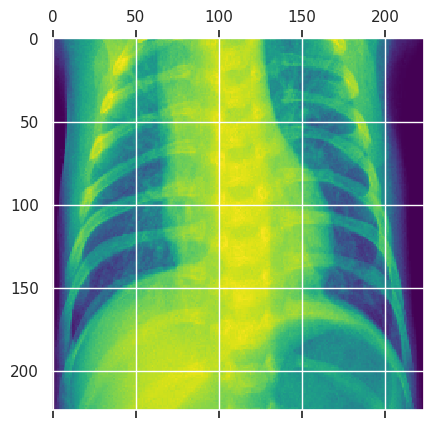

In [38]:
plt.matshow(first_layer_activation[0, :, :, 2], cmap='viridis')

<ipython-input-39-67c32b21b77d>:18: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


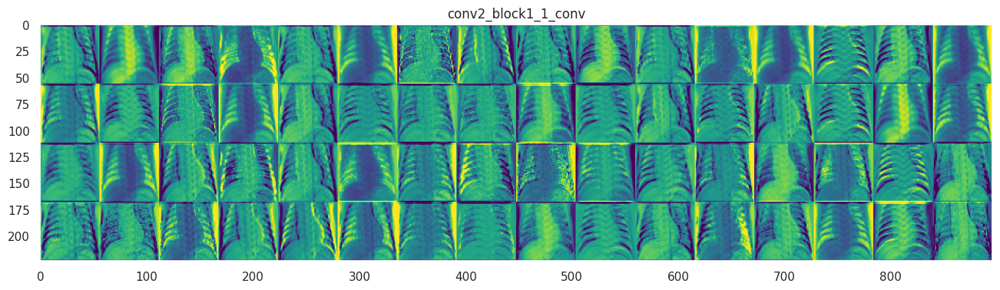

In [39]:
layer_names = []
for layer in model.layers[:8]:
  layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
  n_features = layer_activation.shape[-1]
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0,
                                       :, :,
                                       col * images_per_row + row]
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[col * size : (col + 1) * size,
                   row * size : (row + 1) * size] = channel_image

scale = 1. / size
plt.figure(figsize=(scale * display_grid.shape[1],
scale * display_grid.shape[0]))
plt.title(layer_name)
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')

**Heat map**

In [40]:
for idx in range(len(model.layers)):
  print(model.get_layer(index = idx).name)

input_1
conv1_pad
conv1_conv
pool1_pad
pool1_pool
conv2_block1_preact_bn
conv2_block1_preact_relu
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_pad
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_out
conv2_block2_preact_bn
conv2_block2_preact_relu
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_pad
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_out
conv2_block3_preact_bn
conv2_block3_preact_relu
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_pad
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
max_pooling2d
conv2_block3_3_conv
conv2_block3_out
conv3_block1_preact_bn
conv3_block1_preact_relu
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_pad
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_out
conv3_block2_pre

In [41]:
last_conv_layer_name = "conv5_block3_out"

**class 0**

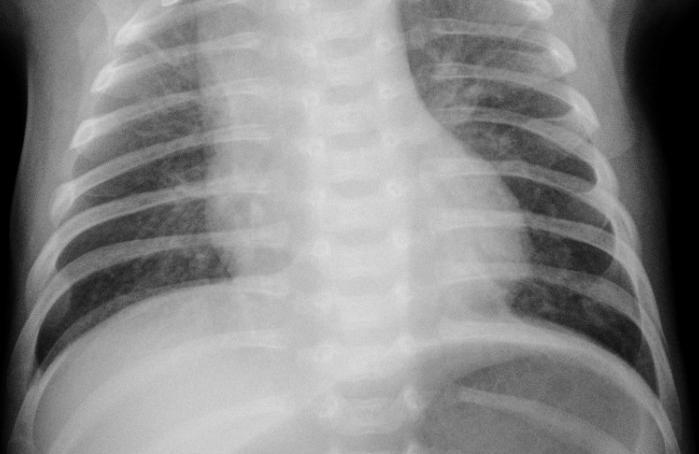

In [42]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
img_size = (224, 224)


# The local path to our target image
img_path = img_class2
display(Image(img_path))

In [43]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

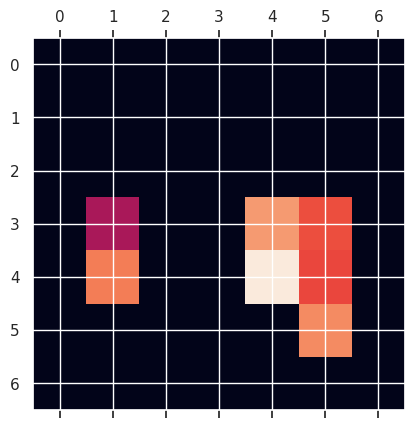

In [44]:
#img_array = preprocess_input(get_img_array(img_path, size=img_size))
image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)
# Remove last layer's softmax
model.layers[-1].activation = None



# Generate class activation heatmap
heatmap = make_gradcam_heatmap(image, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

<ipython-input-45-34e0b9574523>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


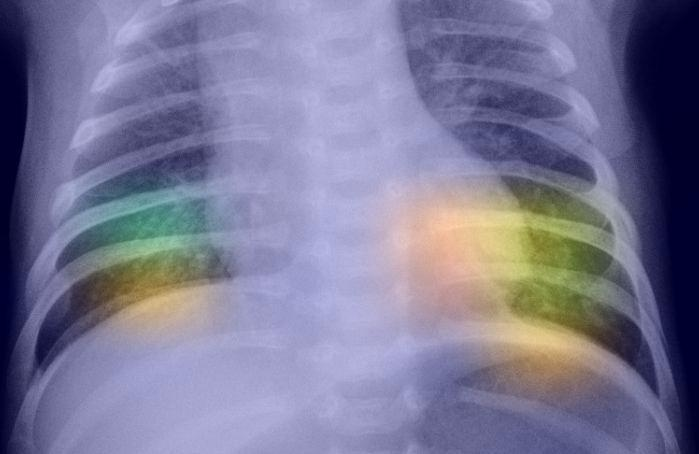

In [45]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

**Class 1**

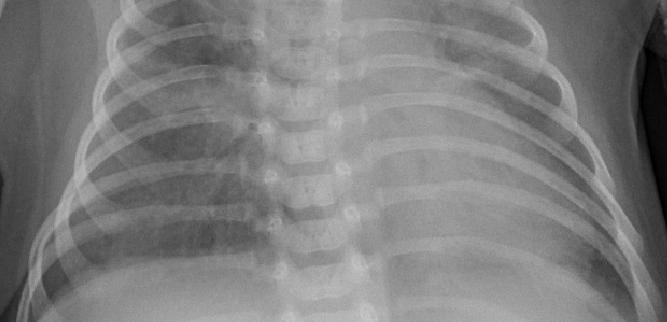

In [46]:
img_size = (224, 224)

# The local path to our target image
img_path = img_class1
display(Image(img_path))

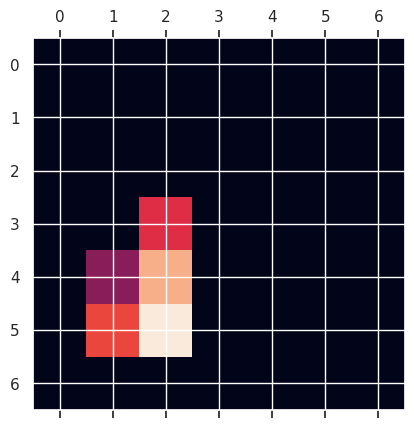

In [47]:
image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)
# Remove last layer's softmax
model.layers[-1].activation = None



# Generate class activation heatmap
heatmap = make_gradcam_heatmap(image, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

<ipython-input-45-34e0b9574523>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


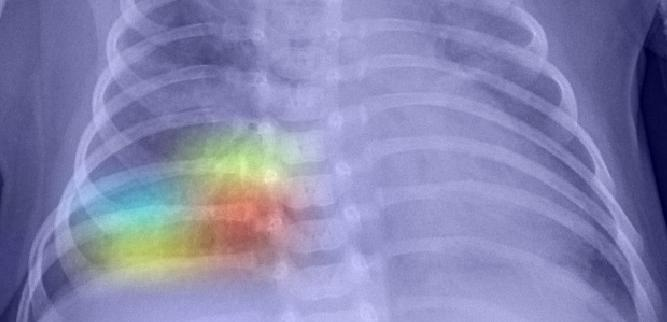

In [48]:
save_and_display_gradcam(img_path, heatmap)

**Class 2**

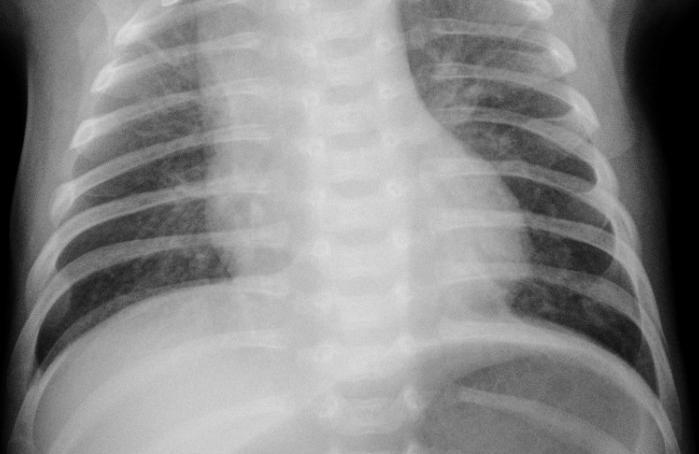

In [49]:
img_size = (224, 224)

# The local path to our target image
img_path = img_class2
display(Image(img_path))

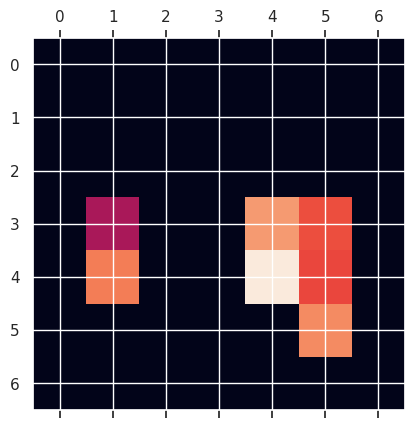

In [50]:
image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)
# Remove last layer's softmax
model.layers[-1].activation = None



# Generate class activation heatmap
heatmap = make_gradcam_heatmap(image, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

<ipython-input-45-34e0b9574523>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


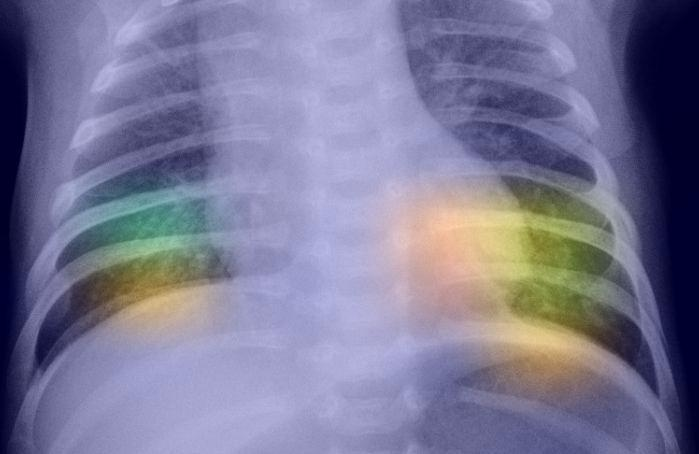

In [51]:
save_and_display_gradcam(img_path, heatmap)

**Grad-CAM Class Activation Visualization**

In [52]:
class GradCAM:
    def __init__(self, model, classs, layerName=None):
        # store the model, the class index used to measure the class
        # activation map, and the layer to be used when visualizing
        # the class activation map
        self.model = model
        self.classs = classs
        self.layerName = layerName
        # if the layer name is None, attempt to automatically find
        # the target output layer
        if self.layerName is None:
            self.layerName = self.find_target_layer()

    def find_target_layer(self):
        # attempt to find the final convolutional layer in the network
        # by looping over the layers of the network in reverse order
        for layer in reversed(self.model.layers):
            # check to see if the layer has a 4D output
            if len(layer.output_shape) == 4:
                return layer.name
        # otherwise, we could not find a 4D layer so the GradCAM
        # algorithm cannot be applied
        raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")


    def compute_heatmap(self, image, eps=1e-8):
        # construct our gradient model by supplying (1) the inputs
        # to our pre-trained model, (2) the output of the (presumably)
        # final 4D layer in the network, and (3) the output of the
        # softmax activations from the model
        gradModel = Model(
            inputs=[self.model.inputs],
            outputs=[self.model.get_layer(self.layerName).output, self.model.output])

        # record operations for automatic differentiation
        with tf.GradientTape() as tape:
            # cast the image tensor to a float-32 data type, pass the
            # image through the gradient model, and grab the loss
            # associated with the specific class index
            inputs = tf.cast(image, tf.float32)
            (convOutputs, predictions) = gradModel(inputs)
            
            loss = predictions[:, tf.argmax(predictions[0])]
    
        # use automatic differentiation to compute the gradients
        grads = tape.gradient(loss, convOutputs)

        # compute the guided gradients
        castConvOutputs = tf.cast(convOutputs > 0, "float32")
        castGrads = tf.cast(grads > 0, "float32")
        guidedGrads = castConvOutputs * castGrads * grads
        # the convolution and guided gradients have a batch dimension
        # (which we don't need) so let's grab the volume itself and
        # discard the batch
        convOutputs = convOutputs[0]
        guidedGrads = guidedGrads[0]

        # compute the average of the gradient values, and using them
        # as weights, compute the ponderation of the filters with
        # respect to the weights
        weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
        cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)

        # grab the spatial dimensions of the input image and resize
        # the output class activation map to match the input image
        # dimensions
        (w, h) = (image.shape[2], image.shape[1])
        heatmap = cv2.resize(cam.numpy(), (w, h))
        # normalize the heatmap such that all values lie in the range
        # [0, 1], scale the resulting values to the range [0, 255],
        # and then convert to an unsigned 8-bit integer
        numer = heatmap - np.min(heatmap)
        denom = (heatmap.max() - heatmap.min()) + eps
        heatmap = numer / denom
        heatmap = (heatmap * 255).astype("uint8")
        # return the resulting heatmap to the calling function
        return heatmap

    def overlay_heatmap(self, heatmap, image, alpha=0.5,
                        colormap=cv2.COLORMAP_VIRIDIS):
        # apply the supplied color map to the heatmap and then
        # overlay the heatmap on the input image
        heatmap = cv2.applyColorMap(heatmap, colormap)
        output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
        # return a 2-tuple of the color mapped heatmap and the output,
        # overlaid image
        return (heatmap, output)

In [53]:
# PREDICTION class0
img_path = img_class0

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 428ms/step


In [54]:
icam = GradCAM(model, i, last_conv_layer_name) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


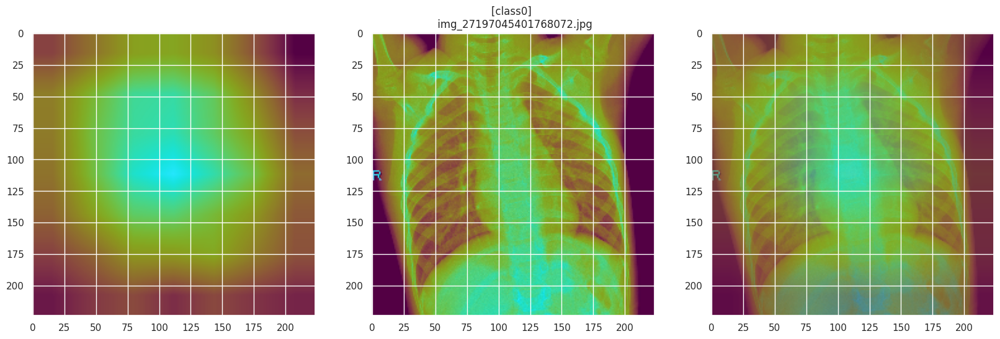

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam1.png', bbox_inches='tight', dpi=300);

In [55]:
# PREDICTION class1
img_path = img_class1

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 25ms/step


In [56]:
icam = GradCAM(model, i, last_conv_layer_name) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


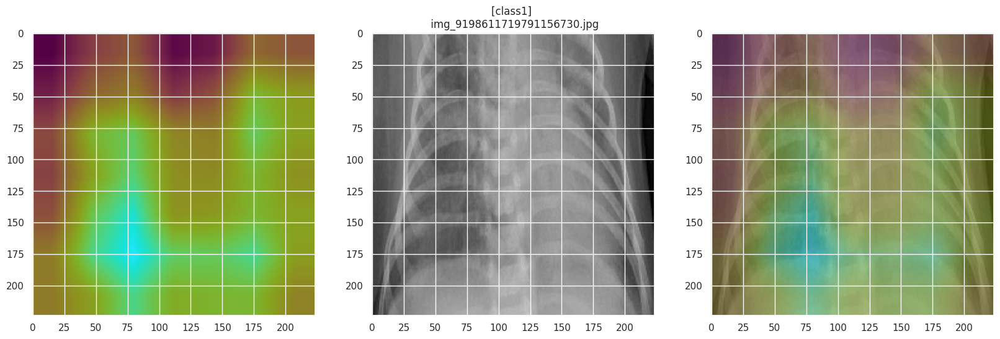

In [57]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam2.png', bbox_inches='tight', dpi=300);

In [58]:
# PREDICTION class2
img_path = img_class2

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 24ms/step


In [59]:
icam = GradCAM(model, i, last_conv_layer_name) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


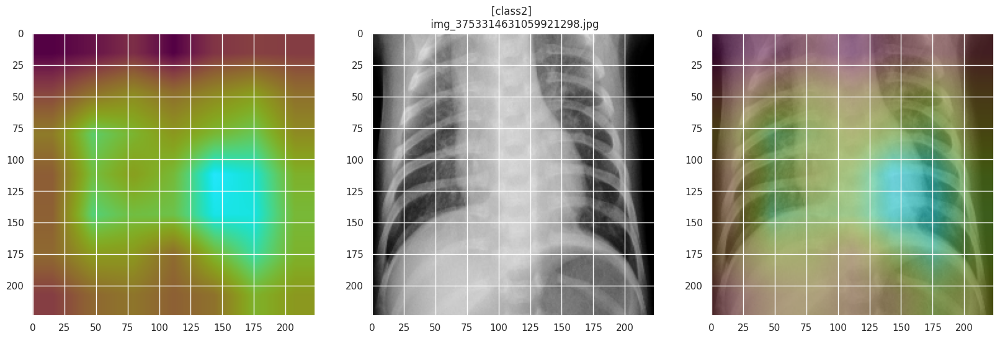

In [60]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam3.png', bbox_inches='tight', dpi=300);